### College of Computing and Informatics, Drexel University
### INFOT780: Applied Machine Learning, Summer 2020
### Due: Wednesday, Sept. 2, 2020
---

## Final Project Report

## Project Title: M5 Forecasting Estimate the unit sales of Walmart Retail goods.

## Team: 

Group 8



## Student(s):
* Aishwarya Ravi (ar3646)

* Anandhi Solaimuthu (as5326)

* Anju Tyagi (at3358)

* Sandeep Kumar Singh (ss4983)

#### Date:

9/2/2020

---

Kaggle Data Link:
https://www.kaggle.com/c/m5-forecasting-accuracy/data

<img src="image_1.png" alt="Drawing" style="width: 500px;"/>

#### Abstract
---
*(Briefly summarize the project including the problem, data sets, modeling process, and final results.)* 

**COMPETITION PROBLEM**

 

In this competition, the hierarchicaal sales data from Walmart has been used. Walmart is the World's largest company by revenue, and the next 28 days daily sales data is forcasted. The data that is been provided in the competition consists of item level, department, product categories and store details of 3 US states i.e., California(CA), Texas (TX), and Wisconsin (WI). The sales information is from Jan 2011 to June 2016. In addition, the data includes explanatory variables such as  sales number, corresponding data on prices, promotions and holidays as well.

 

 
**ABOUT DATASET**

 

The data comprises of 3049 individual products from 3 categories and 7 departments, sold in 10 stores in 3 states. The hierachical aggregation captures the combinations of these factors. 

 

The Training data has 3 seperate files:
 
* sales_train.csv:  The main training data has 1 column for each of the 1941 days from 2011-01-29 and 2016-05-22; not including the validation period of 28 days until 2016-06-19. It also includes the IDs for item, department, category, store, and state. The number of rows is 30490 for all combinations of 30490 items and 10 stores.
* sell_prices.csv: the store and item IDs together with the sales price of the item as a weekly average.

* calendar.csv: dates together with related features like day-of-the week, month, year, and an 3 binary flags for whether the stores in each state allowed purchases with SNAP food stamps at this date (1) or not (0).
 
 
**MODELLING PROCESS**

 

For the time series forcasting models like ARIMA, Prophet is been used in this project. As well as for prediction, models such as lightBGM, XGboost are used along with Linear Regression and logistic regression by fine tunning the hyperparaeters and then compare the RMSE values to evaluate the results.
 

 

Due to the temporal dependencies in time series data, we cannot rely on usual validation techniques. To avoid biased evaluations, it is ensured that the training sets contains observations that occurred prior to the ones in validation sets. A possible way to overcome this problem is to use evaluation technique like sliding window by keeping the fixed training window or Expanding window (by increasing the training windows gradually) This procedure is called time series cross validation. 

 

This accuracy competition will use the metric: Weighted Root Mean Squared Scaled Error (RMSSE). The RMSSE is scale invariant and symmetric, and measures the prediction error (i.e. forecast - truth) relative to a “naive forecast” that simply assumes that step i = step i-1.

<img src="image.png" alt="Drawing" style="width: 500px;"/>

**FINAL RESULTS**

This accuracy competition will use the metric: Weighted Root Mean Squared Scaled Error (RMSSE). The RMSSE is scale invariant and symmetric, and measures the prediction error (i.e. forecast - truth) relative to a “naive forecast” that simply assumes that step i = step i-1.

### 1. Introduction
---
*(Introduce the competition problem, describe your modeling process, and present the results. This section will provide an overview of the entire project including the description of the data sets, and the specific data analysis, wrangling, modeling, and evaluation techniques.)* 

In [3]:
import os
import pandas as pd
import numpy as np
import plotly_express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt

import seaborn as sns
import gc
import warnings
warnings.filterwarnings('ignore')
from lightgbm import LGBMRegressor
import joblib


**OBJECTIVE**

The objective of the competition is to predict the sales data provided by the retail gaint Walmart for 28 days into the future.In addition to forecasting the values themselves in the Forecasting competition, we are simultaneously tasked to estimate the uncertainty of our predictions in the Uncertainty Distribution competition. Both competitions will have the same 28 day forecast horizon.


**Files**

`calendar.csv` - Contains the dates on which products are sold. The dates are in a yyyy/dd/mm format.\
`sales_train_validation.csv` - Contains the historical daily unit sales data per product and store [d_1 - d_1913]\
`sample_submission.csv` - Demonstrates the correct format for submission to the competition.\
`sell_prices.csv` - Contains information about the price of the products sold per store and date.\
`sales_train_evaluation.csv` - Includes sales [d_1 - d_1941] (labels used for the Public leaderboard)

In [13]:
## Loading the datasets
sales = pd.read_csv('sales_train_evaluation.zip')
calendar = pd.read_csv('calendar.csv')
prices = pd.read_csv('sell_prices.zip')


Since, the validation data is now available for the days 1914-1941, Adding zero sales for days: d_1942 - d_1969(Test)

In [14]:
#Adding zero sales for days: d_1942 - d_1969(Test)
for days in range(1942,1970) :
    col = 'd_' + str(days)
    sales[col] = 0
    sales[col] = sales[col].astype(np.int16)

In [15]:
# Sample dataframe
sales.head(2)

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1960,d_1961,d_1962,d_1963,d_1964,d_1965,d_1966,d_1967,d_1968,d_1969
0,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [16]:
# Statistical features of the dataframe
sales.describe()

,d_1,d_2,d_3,d_4,d_5,d_6,d_7,d_8,d_9,d_10,...,d_1960,d_1961,d_1962,d_1963,d_1964,d_1965,d_1966,d_1967,d_1968,d_1969
count,30490.000000,30490.000000,30490.000000,30490.000000,30490.000000,30490.000000,30490.000000,30490.000000,30490.000000,30490.000000,...,30490.0,30490.0,30490.0,30490.0,30490.0,30490.0,30490.0,30490.0,30490.0,30490.0
mean,1.070220,1.041292,0.780026,0.833454,0.627944,0.958052,0.918662,1.244080,1.073663,0.838701,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std,5.126689,5.365468,3.667454,4.415141,3.379344,4.785947,5.059495,6.617729,5.917204,4.206199,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,360.000000,436.000000,207.000000,323.000000,296.000000,314.000000,316.000000,370.000000,385.000000,353.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [17]:
## Concise summary of the dataframe
sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30490 entries, 0 to 30489
Columns: 1975 entries, id to d_1969
dtypes: int16(28), int64(1941), object(6)
memory usage: 454.5+ MB


In [18]:
## Sample dataframe
calendar.head(2)

,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
1,2011-01-30,11101,Sunday,2,1,2011,d_2,NaN,NaN,NaN,NaN,0,0,0


In [19]:
## Statistical features of the dataframe
calendar.describe()

,wm_yr_wk,wday,month,year,snap_CA,snap_TX,snap_WI
count,1969.000000,1969.000000,1969.000000,1969.000000,1969.000000,1969.000000,1969.000000
mean,11347.086338,3.997461,6.325546,2013.288471,0.330117,0.330117,0.330117
std,155.277043,2.001141,3.416864,1.580198,0.470374,0.470374,0.470374
min,11101.000000,1.000000,1.000000,2011.000000,0.000000,0.000000,0.000000
25%,11219.000000,2.000000,3.000000,2012.000000,0.000000,0.000000,0.000000
50%,11337.000000,4.000000,6.000000,2013.000000,0.000000,0.000000,0.000000
75%,11502.000000,6.000000,9.000000,2015.000000,1.000000,1.000000,1.000000
max,11621.000000,7.000000,12.000000,2016.000000,1.000000,1.000000,1.000000


In [20]:
## Concise summary of the dataframe
calendar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1969 entries, 0 to 1968
Data columns (total 14 columns):
date            1969 non-null object
wm_yr_wk        1969 non-null int64
weekday         1969 non-null object
wday            1969 non-null int64
month           1969 non-null int64
year            1969 non-null int64
d               1969 non-null object
event_name_1    162 non-null object
event_type_1    162 non-null object
event_name_2    5 non-null object
event_type_2    5 non-null object
snap_CA         1969 non-null int64
snap_TX         1969 non-null int64
snap_WI         1969 non-null int64
dtypes: int64(7), object(7)
memory usage: 215.4+ KB


In [21]:
## Sample dataframe
prices.head(2)

,store_id,item_id,wm_yr_wk,sell_price
0,CA_1,HOBBIES_1_001,11325,9.58
1,CA_1,HOBBIES_1_001,11326,9.58


In [22]:
## Statistical features of the dataframe
prices.describe()

,wm_yr_wk,sell_price
count,6.841121e+06,6.841121e+06
mean,1.138294e+04,4.410952e+00
std,1.486100e+02,3.408814e+00
min,1.110100e+04,1.000000e-02
25%,1.124700e+04,2.180000e+00
50%,1.141100e+04,3.470000e+00
75%,1.151700e+04,5.840000e+00
max,1.162100e+04,1.073200e+02


In [23]:
## Concise summary of the dataframe
prices.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6841121 entries, 0 to 6841120
Data columns (total 4 columns):
store_id      object
item_id       object
wm_yr_wk      int64
sell_price    float64
dtypes: float64(1), int64(1), object(2)
memory usage: 208.8+ MB


### Downcasting

Memory usage of each data frame before we apply downcasting

In [24]:
## Memory usage of each data frame before we apply downcasting

sales_bd = np.round(sales.memory_usage().sum() / (1024 * 1024), 1)
calendar_bd = np.round(calendar.memory_usage().sum() / (1024 * 1024), 1)
prices_bd = np.round(prices.memory_usage().sum() / (1024 * 1024), 1)

In [25]:
print(sales_bd)
print(prices_bd)
print(calendar_bd)

454.5
208.8
0.2


Depending on our environment, pandas automatically creates int32, int64, float32 or float64 columns for numeric ones. If we know the min or max value of a column, We can use a subtype which is less memory consuming. We can also use an unsigned subtype if there is no negative value.
Here are the different subtypes we can use:

    int8 / uint8 : consumes 1 byte of memory, range between -128/127 or 0/255
    bool : consumes 1 byte, true or false
    float16 / int16 / uint16: consumes 2 bytes of memory, range between -32768 and 32767 or 0/65535
    float32 / int32 / uint32 : consumes 4 bytes of memory, range between -2147483648 and 2147483647
    float64 / int64 / uint64: consumes 8 bytes of memory

If one of our column has values between 1 and 10 for example, We will reduce the size of that column from 8 bytes per row to 1 byte, which is more than 85% memory saving on that column

In [26]:
## Downcasting function

def downcast(df,verbose=True):
    cols = df.dtypes.index.tolist()
    types = df.dtypes.values.tolist()
    start_mem = df.memory_usage().sum() / 1024**2   
    for i,t in enumerate(types):
        if 'int' in str(t):
            if df[cols[i]].min() > np.iinfo(np.int8).min and df[cols[i]].max() < np.iinfo(np.int8).max:
                df[cols[i]] = df[cols[i]].astype(np.int8)
            elif df[cols[i]].min() > np.iinfo(np.int16).min and df[cols[i]].max() < np.iinfo(np.int16).max:
                df[cols[i]] = df[cols[i]].astype(np.int16)
            elif df[cols[i]].min() > np.iinfo(np.int32).min and df[cols[i]].max() < np.iinfo(np.int32).max:
                df[cols[i]] = df[cols[i]].astype(np.int32)
            else:
                df[cols[i]] = df[cols[i]].astype(np.int64)
                
        elif 'float' in str(t):
            if df[cols[i]].min() > np.finfo(np.float16).min and df[cols[i]].max() < np.finfo(np.float16).max:
                df[cols[i]] = df[cols[i]].astype(np.float16)
            elif df[cols[i]].min() > np.finfo(np.float32).min and df[cols[i]].max() < np.finfo(np.float32).max:
                df[cols[i]] = df[cols[i]].astype(np.float32)
            else:
                df[cols[i]] = df[cols[i]].astype(np.float64)
        
        elif t == np.object:
            if cols[i] == 'date':
                df[cols[i]] = pd.to_datetime(df[cols[i]], format = '%Y-%m-%d')
            else:
                df[cols[i]] = df[cols[i]].astype('category')
    end_mem = df.memory_usage().sum() / 1024**2
    if verbose: print('Mem. usage decreased to {:5.2f} Mb ({:.1f}% reduction)'.format(end_mem, 100 * (start_mem - end_mem) / start_mem))
    
    return df
            

Memory usage of each dataframe after downcasting

In [27]:
sales = downcast(sales)
calendar = downcast(calendar)
prices = downcast(prices)

Mem. usage decreased to 97.37 Mb (78.6% reduction)
Mem. usage decreased to  0.14 Mb (33.2% reduction)
Mem. usage decreased to 45.77 Mb (78.1% reduction)


In [31]:
sales_ad = np.round(sales.memory_usage().sum() / (1024 * 1024), 1)
calendar_ad = np.round(calendar.memory_usage().sum() / (1024 * 1024), 1)
prices_ad = np.round(prices.memory_usage().sum() / (1024 * 1024), 1)

In [32]:
# %who DataFrame

In [33]:
gc.collect()

16

Below plot shows how much effect downcasting has had on the memory usage of DataFrames. Clearly, we have been able to reduce sales & prices to less than 1/4th of their actual memory usage. calendar is already a small dataframe.

In [34]:
## Plotting the memory usage of downframes after downcasting
down = {'DataFrame':['sales','calendar','prices'],
       'Before downcasting':[sales_bd,calendar_bd,prices_bd],
       'After downcasting':[sales_ad,calendar_ad,prices_ad]}

memory = pd.DataFrame(down)
memory = pd.melt(memory, id_vars='DataFrame', var_name='Status', value_name='Memory (MB)')
memory.sort_values('Memory (MB)',inplace=True)
fig = px.bar(memory, x='DataFrame', y='Memory (MB)', color='Status', barmode='group', text='Memory (MB)')
fig.update_traces(texttemplate='%{text} MB', textposition='outside')
fig.update_layout(template='seaborn', title='Effect of Downcasting')
fig.show()

#### Melting the data

Currently, the data is in three dataframes: sales, prices & calendar. The sales dataframe contains daily sales data with days(d_1 - d_1969) as columns. The prices dataframe contains items' price details and calendar contains data about the days d.

In this case what the melt function is doing is that it is converting the sales dataframe which is in wide format to a long format. We have kept the id variables as id, item_id, dept_id, cat_id, store_id and state_id. They have in total 30490 unique values when compunded together. Now the total number of days for which we have the data is 1969 days. Therefore the melted dataframe will be having 30490x1969 i.e. 60034810 rows

In [35]:
## Melting sales dataframe
df_melted = pd.melt(sales, id_vars =['id','item_id','dept_id','cat_id','store_id','state_id'], var_name = 'd', value_name = 'sold').dropna()

In [36]:
## Sample dataframe
df_melted.head(2)

,id,item_id,dept_id,cat_id,store_id,state_id,d,sold
0,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0
1,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0


In [37]:
df_melted.shape

(60034810, 8)

#### Merging the data

Combine price data from prices dataframe and days data from calendar dataset.

In [38]:
prices.head()

,store_id,item_id,wm_yr_wk,sell_price
0,CA_1,HOBBIES_1_001,11325,9.578125
1,CA_1,HOBBIES_1_001,11326,9.578125
2,CA_1,HOBBIES_1_001,11327,8.257812
3,CA_1,HOBBIES_1_001,11328,8.257812
4,CA_1,HOBBIES_1_001,11329,8.257812


In [39]:
## Merging 3 dataframes
data = pd.merge(df_melted, calendar, on = 'd', how = 'left')
data = pd.merge(data, prices, on = ['store_id', 'item_id', 'wm_yr_wk'], how = 'left')

In [40]:
## Sample merged dataframe
data.columns

Index(['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id', 'd',
       'sold', 'date', 'wm_yr_wk', 'weekday', 'wday', 'month', 'year',
       'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2',
       'snap_CA', 'snap_TX', 'snap_WI', 'sell_price'],
      dtype='object')

In [41]:
## Statistical features of the merged dataframe
data.describe()

,sold,wm_yr_wk,wday,month,year,snap_CA,snap_TX,snap_WI,sell_price
count,6.003481e+07,6.003481e+07,6.003481e+07,6.003481e+07,6.003481e+07,6.003481e+07,6.003481e+07,6.003481e+07,4.773540e+07
mean,1.114806e+00,1.134709e+04,3.997461e+00,6.325546e+00,2.013288e+03,3.301168e-01,3.301168e-01,3.301168e-01,NaN
std,3.844755e+00,1.552376e+02,2.000633e+00,3.415997e+00,1.579797e+00,4.702549e-01,4.702549e-01,4.702549e-01,0.000000e+00
min,0.000000e+00,1.110100e+04,1.000000e+00,1.000000e+00,2.011000e+03,0.000000e+00,0.000000e+00,0.000000e+00,1.000214e-02
25%,0.000000e+00,1.121900e+04,2.000000e+00,3.000000e+00,2.012000e+03,0.000000e+00,0.000000e+00,0.000000e+00,2.179688e+00
50%,0.000000e+00,1.133700e+04,4.000000e+00,6.000000e+00,2.013000e+03,0.000000e+00,0.000000e+00,0.000000e+00,3.470703e+00
75%,1.000000e+00,1.150200e+04,6.000000e+00,9.000000e+00,2.015000e+03,1.000000e+00,1.000000e+00,1.000000e+00,5.839844e+00
max,7.630000e+02,1.162100e+04,7.000000e+00,1.200000e+01,2.016000e+03,1.000000e+00,1.000000e+00,1.000000e+00,1.073125e+02


In [307]:
## Concise features of the merged dataframe
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 60034810 entries, 0 to 60034809
Data columns (total 22 columns):
id              category
item_id         category
dept_id         category
cat_id          category
store_id        category
state_id        category
d               object
sold            int16
date            datetime64[ns]
wm_yr_wk        int16
weekday         category
wday            int8
month           int8
year            int16
event_name_1    category
event_type_1    category
event_name_2    category
event_type_2    category
snap_CA         int8
snap_TX         int8
snap_WI         int8
sell_price      float16
dtypes: category(11), datetime64[ns](1), float16(1), int16(3), int8(5), object(1)
memory usage: 2.8+ GB


In [308]:
_=downcast(data)

Mem. usage decreased to 2520.84 Mb (12.0% reduction)



**Modelling of the Data will be performed using the below steps:**
 
• Train-test split<br>
• scale the data for some models where it is required.<br>
• Experimented using the feature engineering techniques for time series.<br>
• Create a predictions data frame<br>
• score the models<br> 

**Evaluation Techniques**

* LinearRegression	
* SVR	
* KNeighborsRegressor	
* RandomForestRegressor
* Decision Tree	
* LogisticRegression	
* LGBMRegressor	
* XGBRegressor	

### 2. Explore the Data
---
*(Study each attribute and its characteristics. Study the correlations between attributes. Study how you would solve the problem manually. Identify the promising transformations you may want to apply.)*

he M5 dataset, generously made available by Walmart, involves the unit sales of various products sold in the USA, organized in the form of grouped time series. More specifically, the dataset involves the unit sales of 3,049 products, classified in 3 product categories (Hobbies, Foods, and Household) and 7 product departments, in which the above-mentioned categories are disaggregated. The products are sold across ten stores, located in three States (CA, TX, and WI).

We have drawn an interactive visualization showing the distribution of 3049 items across different aggregation levels.

**Overall distribution of items in all walmart stores**

In [42]:
## Plotting the overall distribution of items 
group = sales.groupby(['state_id','store_id','cat_id','dept_id'],as_index=False)['item_id'].count().dropna()
group['USA'] = 'United States of America'
group.rename(columns={'state_id':'State','store_id':'Store','cat_id':'Category','dept_id':'Department','item_id':'Count'},inplace=True)
fig = px.treemap(group, path=['USA', 'State', 'Store', 'Category', 'Department'], values='Count',
                  color='Count',
                  color_continuous_scale= px.colors.sequential.Sunset,
                  title='Walmart: Distribution of items')
fig.update_layout(template='seaborn')
fig.show()

Here we'll be studying about the item prices and their distribution. Please note the prices vary weekly. So to study the distribution of prices I have taken their average.

In [43]:
## Plotting the distribution of items prices w.r.t. to stores

group_price_store = data.groupby(['state_id','store_id','item_id'], as_index = False)['sell_price'].mean().dropna()
fig = px.box(group_price_store, x = 'store_id', color = 'state_id', y= 'sell_price', hover_name = 'item_id')
fig.update_xaxes(title_text ='store')
fig.update_yaxes(title_text ='Selling Price($)')
fig.update_layout(template = 'seaborn', title = 'Distribution of Items prices wrt Stores', legend_title_text = 'State')
fig.show()

Below are some of the observations from the above plot:-

    * The distribution of item prices is almost uniform for all the stores across Califoria, Texas and Wisconsin.
    * Item HOBBIES_1_361 priced at around 30.5 dollars is the costliest item being sold at walmarts across California.
    * Item HOUSEHOLD_1_060 priced at around 29.875 dollars is the costliest item being sold at walmarts across Texas.
    * Item HOBBIES_1_361 priced at around 30.48 dollars is the costliest item being sold at TX_1 and TX_3 in Texas. While item HOBBIES_1_255 priced at around 30.5 dollars is the costliest at TX_2

In [44]:
data.columns

Index(['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id', 'd',
       'sold', 'date', 'wm_yr_wk', 'weekday', 'wday', 'month', 'year',
       'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2',
       'snap_CA', 'snap_TX', 'snap_WI', 'sell_price'],
      dtype='object')

In [45]:
## Plotting the distribution of items prices w.r.t. stores across categories
group_price_category = data.groupby(['store_id', 'cat_id', 'item_id'], as_index = False)['sell_price'].mean().dropna()

plot = px.box(group_price_category, x='store_id', color='cat_id', y='sell_price', hover_name='item_id')
plot.update_xaxes(title_text = 'Store')
plot.update_yaxes(title_text = 'Selling Prices ($)')
plot.update_layout(template = 'seaborn', title = 'Distribution of Items prices wrt Stores across Categories', legend_title_text='Category')
plot.show()

From the plot above we observe that, food category items are quite cheap as compared with hobbies and household items. Hobbies and household items have almost the same price range.

In [46]:
## Plotting the distribution of items sold w.r.t. stores

items_sold_group = data.groupby(['year', 'date', 'state_id', 'store_id'], as_index= False)['sold'].sum().dropna()

plot = px.histogram(items_sold_group, x='store_id', color='state_id', y='sold')
plot.update_xaxes(title_text='Store')
plot.update_yaxes(title_text='Total items sold')
plot.update_layout(template = 'seaborn', title = 'Distribution of Items sold wrt Stores', legend_title_text = 'State')
plot.show()

In [47]:
data.columns

Index(['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id', 'd',
       'sold', 'date', 'wm_yr_wk', 'weekday', 'wday', 'month', 'year',
       'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2',
       'snap_CA', 'snap_TX', 'snap_WI', 'sell_price'],
      dtype='object')

Below are some of the observations from the above plot:-

    * California: CA_3 has sold the most number of items while, CA_4 has sold the least number of items.
    * Texas: TX_2 and TX_3 have sold the maximum number of items. TX_1 has sold the least number of items.
    * Wisconsin: WI_2 has sold the maximum number of items while, WI_3 has sold the least number of items.
    * USA: CA_3 has sold the most number of items while, CA_4 has sold the least number of items.

In [48]:
## Distribution of sold items individual storewise across all 3 states

plot = go.Figure()
title = 'Items sold over time'
years = items_sold_group.year.unique().tolist()
# print(years)
buttons = []
y = 3
state_id = items_sold_group.state_id.unique().tolist()
# print(state_id)
for state in state_id:
    group_state = items_sold_group[items_sold_group['state_id'] == state]
#     print(group_state)
    for store in group_state.store_id.unique().tolist():
#         print(store)
        group_state_store = group_state[group_state['store_id'] == store]
#         print(group_state_store)
        plot.add_trace(go.Scatter(name = store, x = group_state_store['date'], y = group_state_store['sold'], 
                                 showlegend = True, yaxis = 'y'+str(y) if y!= 1 else 'y'))
    y-=1
plot.update_layout(
    xaxis = dict(
    range = ['2011-01-29', '2016-05-22'],
    rangeselector = dict(
    buttons = list([
        dict(count = 1,
            label = '1m',
            step = 'month',
            stepmode = 'backward'),
        dict(count = 6,
            label = '6m',
            step = 'month',
            stepmode = 'backward'),
        dict(count = 1,
            label = 'YTD',
            step = 'year',
            stepmode = 'todate'),
        dict(count = 1,
            label = '1y',
            step = 'year',
            stepmode = 'backward'),
        dict(count = 2,
            label = '2y',
            step = 'year',
            stepmode = 'backward'),
        dict(count = 3,
            label = '3y',
            step = 'year',
            stepmode = 'backward'),
        dict(count = 4,
            label = '4y',
            step = 'year',
            stepmode = 'backward'),
        dict (step = 'all')
            
    ])
    ),
    rangeslider = dict(
    autorange = True,
    ),
    type = 'date'
    ),
    yaxis=dict(
        anchor="x",
        autorange=True,
        domain=[0, 0.33],
        mirror=True,
        showline=True,
        side="left",
        tickfont={"size":10},
        tickmode="auto",
        ticks="",
        title='WI',
        titlefont={"size":20},
        type="linear",
        zeroline=False
    ),
    yaxis2=dict(
        anchor="x",
        autorange=True,
        domain=[0.33, 0.66],
        mirror=True,
        showline=True,
        side="left",
        tickfont={"size":10},
        tickmode="auto",
        ticks="",
        title = 'TX',
        titlefont={"size":20},
        type="linear",
        zeroline=False
    ),
    yaxis3=dict(
        anchor="x",
        autorange=True,
        domain=[0.66, 0.99],
        mirror=True,
        showline=True,
        side="left",
        tickfont={"size":10},
        tickmode="auto",
        ticks='',
        title="CA",
        titlefont={"size":20},
        type="linear",
        zeroline=False
    )
)
plot.update_layout(template = 'plotly', title = title)
plot.show()


    * Stores in WI have similar item sold count.
    * Before 2013, WI_3 is the most sold store in WI, but WI_2 gradually increases its proportion. (Especially around summer in 2012)
    * In some point, WI_1 rapidly increase its sold item count. (Around on November 2012)
    * TX_2 has most item sold especially before 2014.
    * From around 2015 Spring or Summer, CA_2 increased its sold record rapidly

In [49]:
df=data.copy()

In [50]:
## Conversion date to int type 

def add_date_feature(df):
    df["year"] = df["date"].dt.year.astype("int16")
    df["month"] = df["date"].dt.month.astype("int8")
    df["week"] = df["date"].dt.week.astype("int8")
    df["day"] = df["date"].dt.day.astype("int8")
    df["quarter"]  = df["date"].dt.quarter.astype("int8")
    return df

In [51]:
df = add_date_feature(df)
df.head(2)

,id,item_id,dept_id,cat_id,store_id,state_id,d,sold,date,wm_yr_wk,...,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI,sell_price,week,day,quarter
0,HOBBIES_1_001_CA_1_evaluation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,NaN,NaN,NaN,0,0,0,NaN,4,29,1
1,HOBBIES_1_002_CA_1_evaluation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,...,NaN,NaN,NaN,0,0,0,NaN,4,29,1


In [52]:
temp_series = df.groupby(["cat_id", "date"])["sold"].sum()
temp_series.head()

cat_id  date      
FOODS   2011-01-29    23178.0
        2011-01-30    22758.0
        2011-01-31    17174.0
        2011-02-01    18878.0
        2011-02-02    14603.0
Name: sold, dtype: float64

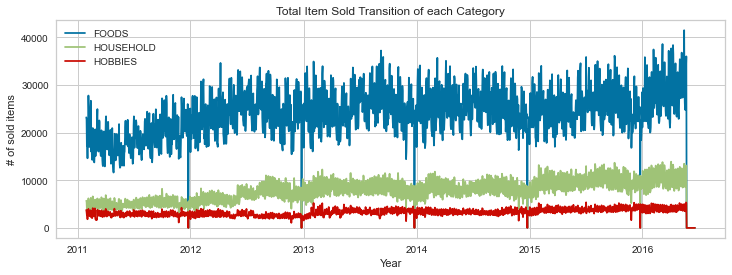

In [337]:
## Plotting total items sold transition of each category
plt.figure(figsize=(12, 4))
plt.plot(temp_series[temp_series.index.get_level_values("cat_id") == "FOODS"].index.get_level_values("date"), temp_series[temp_series.index.get_level_values("cat_id") == "FOODS"].values, label="FOODS")
plt.plot(temp_series[temp_series.index.get_level_values("cat_id") == "HOUSEHOLD"].index.get_level_values("date"), temp_series[temp_series.index.get_level_values("cat_id") == "HOUSEHOLD"].values, label="HOUSEHOLD")
plt.plot(temp_series[temp_series.index.get_level_values("cat_id") == "HOBBIES"].index.get_level_values("date"), temp_series[temp_series.index.get_level_values("cat_id") == "HOBBIES"].values, label="HOBBIES")
plt.xlabel("Year")
plt.ylabel("# of sold items")
plt.title("Total Item Sold Transition of each Category")
plt.legend()

Some points we noticed in above visualization

    * FOODS is the most sold item category of these three categories.
    * HOUSEHOLD is the 2nd one, and HOBBIES are the least sold one.
    * FOODS category appearently has some periodical feature.During one year, it seems more items are sold in summer than in winter, however, we have to verify this.As for more short time interval, it seems the trend has monthly or weekly features. 
    * HOUSEHOLD category items sold is gradually increasing from 2011.However, it may be because some items are not in the store in 2011.
    * In HOBBIES category, periodical features are less appearent like HOUSEHOLD category.

In [55]:
data.columns

Index(['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id', 'd',
       'sold', 'date', 'wm_yr_wk', 'weekday', 'wday', 'month', 'year',
       'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2',
       'snap_CA', 'snap_TX', 'snap_WI', 'sell_price'],
      dtype='object')

Will try to visualize only the latest year from january 2015

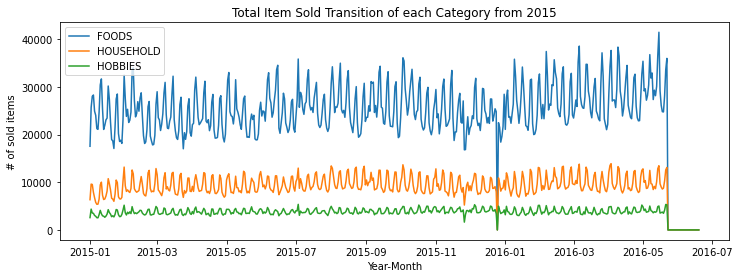

In [56]:
## Plotting the total Item Sold Transition of each Category from 2015

temp_series = temp_series.loc[temp_series.index.get_level_values("date") >= "2015-01-01"]

plt.figure(figsize=(12, 4))
plt.plot(temp_series[temp_series.index.get_level_values("cat_id") == "FOODS"].index.get_level_values("date"), temp_series[temp_series.index.get_level_values("cat_id") == "FOODS"].values, label="FOODS")
plt.plot(temp_series[temp_series.index.get_level_values("cat_id") == "HOUSEHOLD"].index.get_level_values("date"), temp_series[temp_series.index.get_level_values("cat_id") == "HOUSEHOLD"].values, label="HOUSEHOLD")
plt.plot(temp_series[temp_series.index.get_level_values("cat_id") == "HOBBIES"].index.get_level_values("date"), temp_series[temp_series.index.get_level_values("cat_id") == "HOBBIES"].values, label="HOBBIES")
plt.xlabel("Year-Month")
plt.ylabel("# of sold items")
plt.title("Total Item Sold Transition of each Category from 2015")
plt.legend()

    * In all categories, the periodical trends is seemed weekly.
    * In previous graph, we can't easily recognize that HOUSEHOLD and HOBBIES have weekly features, but in this graph we can.
    * The day when all item sold is 0 is seemed to be Christmas Day, not new year's day, confirm it below.

For confirming the sales is close to zero let's try to visualize the data only for the month of december.

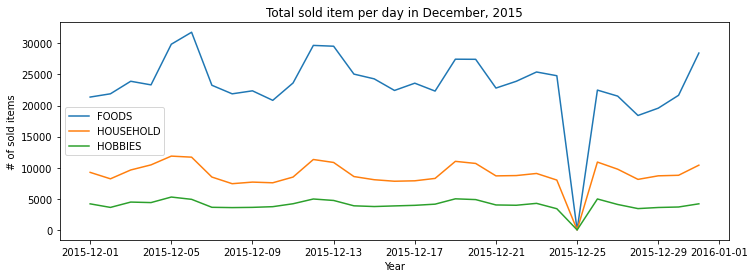

In [57]:
# Plotting the items sold on December 2015

temp_series = temp_series.loc[(temp_series.index.get_level_values("date") >= "2015-12-01") & (temp_series.index.get_level_values("date") <= "2015-12-31")]

plt.figure(figsize=(12, 4))
plt.plot(temp_series[temp_series.index.get_level_values("cat_id") == "FOODS"].index.get_level_values("date"), temp_series[temp_series.index.get_level_values("cat_id") == "FOODS"].values, label="FOODS")
plt.plot(temp_series[temp_series.index.get_level_values("cat_id") == "HOUSEHOLD"].index.get_level_values("date"), temp_series[temp_series.index.get_level_values("cat_id") == "HOUSEHOLD"].values, label="HOUSEHOLD")
plt.plot(temp_series[temp_series.index.get_level_values("cat_id") == "HOBBIES"].index.get_level_values("date"), temp_series[temp_series.index.get_level_values("cat_id") == "HOBBIES"].values, label="HOBBIES")
plt.xlabel("Year")
plt.ylabel("# of sold items")
plt.title("Total sold item per day in December, 2015")
plt.legend()

    * On Christmas Day, the items sold are seemed to be 0

In [58]:
temp_series.loc[(temp_series.index.get_level_values("date") >= "2015-12-24") & (temp_series.index.get_level_values("date") <= "2015-12-26")]

cat_id     date      
FOODS      2015-12-24    24801.0
           2015-12-25       13.0
           2015-12-26    22488.0
HOBBIES    2015-12-24     3408.0
           2015-12-25        0.0
           2015-12-26     4977.0
HOUSEHOLD  2015-12-24     8018.0
           2015-12-25        1.0
           2015-12-26    10912.0
Name: sold, dtype: float64

Some items are sold even on Christmas Day, but I think these are completely noisy values.

Now let's try to visualize the daily sales of item, In order to check which day of the week is the items sold most

In [61]:
temp_series = df.groupby(["cat_id", "wday"])["sold"].sum()

In [62]:
data.columns

Index(['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id', 'd',
       'sold', 'date', 'wm_yr_wk', 'weekday', 'wday', 'month', 'year',
       'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2',
       'snap_CA', 'snap_TX', 'snap_WI', 'sell_price'],
      dtype='object')

Text(0.5, 1.0, 'Total sold item in each daytype')

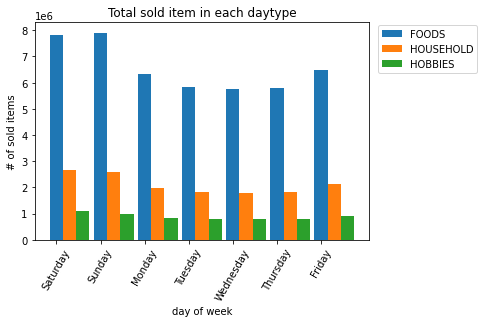

In [63]:
## Plotting the maximum sold items day wise
plt.figure(figsize=(6, 4))
left = np.arange(1,8) 
width = 0.3
weeklabel = ["Saturday", "Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday"]    # Please Confirm df


plt.bar(left, temp_series[temp_series.index.get_level_values("cat_id") == "FOODS"].values, width=width, label="FOODS")
plt.bar(left + width, temp_series[temp_series.index.get_level_values("cat_id") == "HOUSEHOLD"].values, width=width, label="HOUSEHOLD")
plt.bar(left + width + width, temp_series[temp_series.index.get_level_values("cat_id") == "HOBBIES"].values, width=width, label="HOBBIES")
plt.legend(bbox_to_anchor=(1.01, 1.01))
plt.xticks(left, weeklabel, rotation=60)
plt.xlabel("day of week")
plt.ylabel("# of sold items")
plt.title("Total sold item in each daytype")

    * As we can probraly guess, Saturday or Sunday is the day which the items are most sold.
    * Tuesday or Wednesday is the least sold days.
    * Later, we visualize these correlation factors with heatmap. Looking forward to it!
    * HOBBIES are not so day dependent compared to FOODS or HOUSEHOLD.

Item sold in each State and Store

In [64]:
temp_series = df.groupby(["state_id", "date"])["sold"].sum()

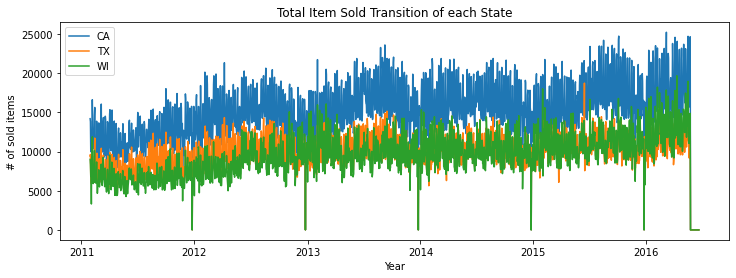

In [65]:
## Plotting the total items sold of each state

plt.figure(figsize=(12, 4))
plt.plot(temp_series[temp_series.index.get_level_values("state_id") == "CA"].index.get_level_values("date"), temp_series[temp_series.index.get_level_values("state_id") == "CA"].values, label="CA")
plt.plot(temp_series[temp_series.index.get_level_values("state_id") == "TX"].index.get_level_values("date"), temp_series[temp_series.index.get_level_values("state_id") == "TX"].values, label="TX")
plt.plot(temp_series[temp_series.index.get_level_values("state_id") == "WI"].index.get_level_values("date"), temp_series[temp_series.index.get_level_values("state_id") == "WI"].values, label="WI")
plt.xlabel("Year")
plt.ylabel("# of sold items")
plt.title("Total Item Sold Transition of each State")
plt.legend()

    * CA is the most sold state of these three states.
    * TX and WI are not so different except for the year 2011 and 2012.
    * All three states have some periodical features as we've already seen in category-based item sold graph.

Will take one state at a time and try to see sales

##### California

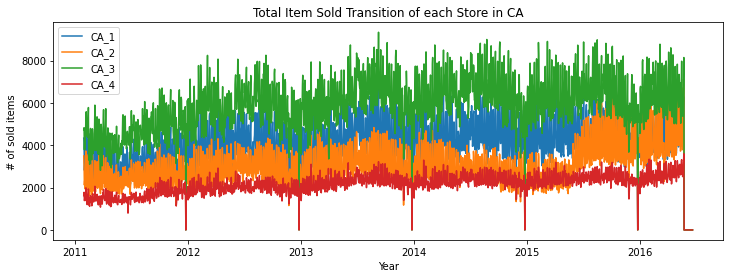

In [66]:
## Statewise sales 
temp_series = df.groupby(["store_id", "date"])["sold"].sum()

plt.figure(figsize=(12, 4))
plt.plot(temp_series[temp_series.index.get_level_values("store_id") == "CA_1"].index.get_level_values("date"), temp_series[temp_series.index.get_level_values("store_id") == "CA_1"].values, label="CA_1")
plt.plot(temp_series[temp_series.index.get_level_values("store_id") == "CA_2"].index.get_level_values("date"), temp_series[temp_series.index.get_level_values("store_id") == "CA_2"].values, label="CA_2")
plt.plot(temp_series[temp_series.index.get_level_values("store_id") == "CA_3"].index.get_level_values("date"), temp_series[temp_series.index.get_level_values("store_id") == "CA_3"].values, label="CA_3")
plt.plot(temp_series[temp_series.index.get_level_values("store_id") == "CA_4"].index.get_level_values("date"), temp_series[temp_series.index.get_level_values("store_id") == "CA_4"].values, label="CA_4")

plt.xlabel("Year")
plt.ylabel("# of sold items")
plt.title("Total Item Sold Transition of each Store in CA")
plt.legend()

    * Three stores in CA have similar amount of item sold record.
    * CA_3 has more item sold a little bit compared to others.
    * The standard deviation of each store seems different, confirm it later.
    * From around 2015 Spring or Summer, CA_2 increased its sold record rapidly. We have to investigate the reasons.

    * With lineplot method in seaborn, we can plot single line with error bands showing a confidence interval.You can serach seaborn lineplot and find this sentence. (https://seaborn.pydata.org/generated/seaborn.lineplot.html)
    * By default, the plot aggregates over multiple y values at each value of x and shows an estimate of the central tendency and a confidence interval for that estimate.
    * In this case, this command plots each month item sold standard deviation with confidence interval in 4 years. (From 2011 to 2015)
    * Since CA_3 is the most sold store in CA, standard deviation of this store is also higher than others.

#### Winconsin

In [67]:
data.columns

Index(['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id', 'd',
       'sold', 'date', 'wm_yr_wk', 'weekday', 'wday', 'month', 'year',
       'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2',
       'snap_CA', 'snap_TX', 'snap_WI', 'sell_price'],
      dtype='object')

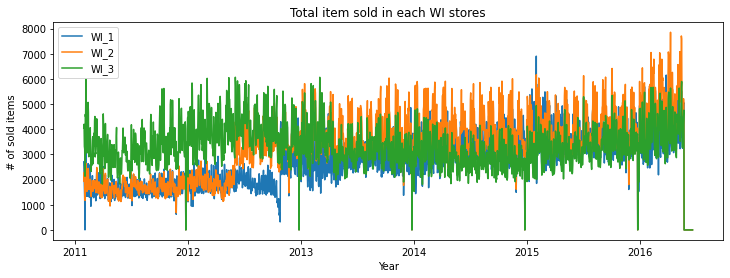

In [68]:
## Statewise sales 
temp_series = df.groupby(["store_id", "date"])["sold"].sum()

plt.figure(figsize=(12, 4))
plt.plot(temp_series[temp_series.index.get_level_values("store_id") == "WI_1"].index.get_level_values("date"), temp_series[temp_series.index.get_level_values("store_id") == "WI_1"].values, label="WI_1")
plt.plot(temp_series[temp_series.index.get_level_values("store_id") == "WI_2"].index.get_level_values("date"), temp_series[temp_series.index.get_level_values("store_id") == "WI_2"].values, label="WI_2")
plt.plot(temp_series[temp_series.index.get_level_values("store_id") == "WI_3"].index.get_level_values("date"), temp_series[temp_series.index.get_level_values("store_id") == "WI_3"].values, label="WI_3")
plt.xlabel("Year")
plt.ylabel("# of sold items")
plt.title("Total item sold in each WI stores")
plt.legend()

    * Stores in WI have similar item sold count. Before 2013, WI_3 is the most sold store in WI, but WI_2 gradually increases its proportion. (Especially around summer in 2012)
    * In some point, WI_1 rapidly increase its sold item count. (Around on November 2012)

#### Texas

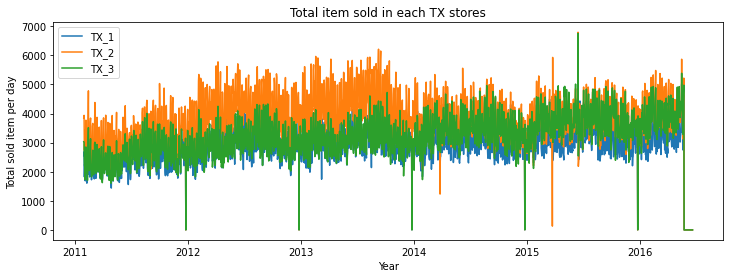

In [69]:
## Statewise sales
temp_series = df.groupby(["store_id", "date"])["sold"].sum()

plt.figure(figsize=(12, 4))
plt.plot(temp_series[temp_series.index.get_level_values("store_id") == "TX_1"].index.get_level_values("date"), temp_series[temp_series.index.get_level_values("store_id") == "TX_1"].values, label="TX_1")
plt.plot(temp_series[temp_series.index.get_level_values("store_id") == "TX_2"].index.get_level_values("date"), temp_series[temp_series.index.get_level_values("store_id") == "TX_2"].values, label="TX_2")
plt.plot(temp_series[temp_series.index.get_level_values("store_id") == "TX_3"].index.get_level_values("date"), temp_series[temp_series.index.get_level_values("store_id") == "TX_3"].values, label="TX_3")
plt.xlabel("Year")
plt.ylabel("Total sold item per day")
plt.title("Total item sold in each TX stores")
plt.legend()

    * In 2015, it seems some extreme points exist.
    * For exmaple, around Febrary, TX_2 has almost 0 item sold. (I assume this store is closed exceptionally.) In contrast, in one summer day of that year, TX_3 increased its total item sold exprosively.
    * TX_2 has most item sold especially before 2014.

#### Standard deviation analysis in each store

In previous plot we found that CA_3 has a little bit more sales than other stores in CA. Will check the deviation of these stores.

In [72]:
temp_series = df.groupby(["state_id", "store_id", "month"])["sold"].std()

Text(0.5, 0.98, 'Standard deviation of sold items in one month in each store')

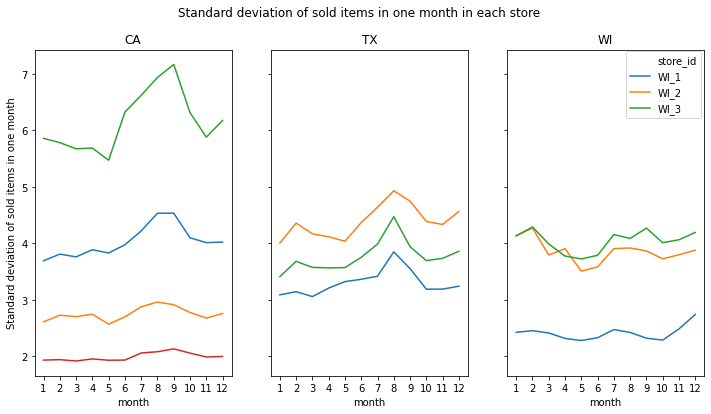

In [73]:
## Here we find the standard deviation of sold items in one month in each store.

fig, axs = plt.subplots(1, 3, figsize=(12, 6), sharey=True)

# We can use for loop, of course! And that'll be better, sorry, this is for my easy trial. 
sns.lineplot(x=temp_series[(temp_series.index.get_level_values("state_id") == "CA")].index.get_level_values("month"), 
             y=temp_series[(temp_series.index.get_level_values("state_id") == "CA")].values, 
             hue=temp_series[(temp_series.index.get_level_values("state_id") == "CA")].index.get_level_values("store_id"), 
             legend=False,
             ax=axs[0])
sns.lineplot(x=temp_series[temp_series.index.get_level_values("state_id") == "TX"].index.get_level_values("month"),
             y=temp_series[temp_series.index.get_level_values("state_id") == "TX"].values, 
             hue=temp_series[temp_series.index.get_level_values("state_id") == "TX"].index.get_level_values("store_id"), 
             legend=False,
             ax=axs[1])
sns.lineplot(x=temp_series[temp_series.index.get_level_values("state_id") == "WI"].index.get_level_values("month"),
             y=temp_series[temp_series.index.get_level_values("state_id") == "WI"].values, 
             hue=temp_series[temp_series.index.get_level_values("state_id") == "WI"].index.get_level_values("store_id"),
             ax=axs[2])



plt.legend(bbox_to_anchor=(1.01, 1.01))
axs[0].set_title("CA")
axs[0].set_xticks(range(1, 13))
axs[0].set_ylabel("Standard deviation of sold items in one month")
axs[1].set_title("TX")
axs[1].set_xticks(range(1, 13))
axs[2].set_title("WI")
axs[2].set_xticks(range(1, 13))

fig.suptitle("Standard deviation of sold items in one month in each store")

### 3. Prepare the Data
---
*(Clean and wrangle the data including fixing or removing outliers, dealing with missing values, feature scaling, feature transformation, and more. Write necessary functions for reuse and modularization.)*

In [74]:
data.columns

Index(['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id', 'd',
       'sold', 'date', 'wm_yr_wk', 'weekday', 'wday', 'month', 'year',
       'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2',
       'snap_CA', 'snap_TX', 'snap_WI', 'sell_price'],
      dtype='object')

### Feature Engineering

Time Series data must be re-framed as a supervised learning dataset before we can start using machine learning algorithms.

There is no concept of input and output features in time series. Instead, we must choose the variable to be predicted and use feature engineering to construct all of the inputs that will be used to make predictions for future time steps.

The goal of feature engineering is to provide strong and ideally simple relationships between new input features and the output feature for the supervised learning algorithm to model.

In [75]:
data['revenue'] = data['sold']*data['sell_price'].astype(np.float32)

### Label Encoding

* Remove unwanted data to create space in RAM for further processing.
* Label Encode categorical features.(I had converted already converted categorical variable to category type. So, I can simply use their codes instead of using LableEncoder)
* Remove date as its features are already present.


We are storing the categories correponding to their respective category codes so that I'can use them later on while making the submission.


In [76]:
#Store the categories along with their codes
d_id = dict(zip(data.id.cat.codes, data.id))
d_item_id = dict(zip(data.item_id.cat.codes, data.item_id))
d_dept_id = dict(zip(data.dept_id.cat.codes, data.dept_id))
d_cat_id = dict(zip(data.cat_id.cat.codes, data.cat_id))
d_store_id = dict(zip(data.store_id.cat.codes, data.store_id))
d_state_id = dict(zip(data.state_id.cat.codes, data.state_id))

In [77]:
gc.collect();

In [78]:
data.d = data['d'].apply(lambda x: x.split('_')[1]).astype(np.int16)
cols = data.dtypes.index.tolist()
types = data.dtypes.values.tolist()
for i,type in enumerate(types):
    if type.name == 'category':
        data[cols[i]] = data[cols[i]].cat.codes
        
#3
data.drop('date',axis=1,inplace=True)

In [79]:
data.columns

Index(['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id', 'd',
       'sold', 'wm_yr_wk', 'weekday', 'wday', 'month', 'year', 'event_name_1',
       'event_type_1', 'event_name_2', 'event_type_2', 'snap_CA', 'snap_TX',
       'snap_WI', 'sell_price', 'revenue'],
      dtype='object')

#### Introduce Lags

Lag features are the classical way that time series forecasting problems are transformed into supervised learning problems.

Introduce lags to the the target variable `sold`. The maximum lag I have introduced is 36 days. It's purely upto you how many lags you want to introduce.

In [80]:
#Introduce lags
lags = [1,2,3,6,12,24,36]
for lag in lags:
    data['sold_lag_'+str(lag)] = data.groupby(['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id'],as_index=False)['sold'].shift(lag).astype(np.float16)

#### Mean Encoding


From a mathematical point of view, mean encoding represents a probability of your target variable, conditional on each value of the feature. In a way, it embodies the target variable in its encoded value. I have calculated mean encodings on the basis of following logical features I could think of:-
- item
- state
- store
- category
- department
- category & department
- store & item
- category & item
- department & item
- state & store
- state, store and category
- store, category and department


In [81]:
# Mean Encoding
data['iteam_sold_avg'] = data.groupby('item_id')['sold'].transform('mean').astype(np.float16)
data['state_sold_avg'] = data.groupby('state_id')['sold'].transform('mean').astype(np.float16)
data['store_sold_avg'] = data.groupby('store_id')['sold'].transform('mean').astype(np.float16)
data['cat_sold_avg'] = data.groupby('cat_id')['sold'].transform('mean').astype(np.float16)
data['dept_sold_avg'] = data.groupby('dept_id')['sold'].transform('mean').astype(np.float16)
data['cat_dept_sold_avg'] = data.groupby(['cat_id','dept_id'])['sold'].transform('mean').astype(np.float16)
data['store_item_sold_avg'] = data.groupby(['store_id','item_id'])['sold'].transform('mean').astype(np.float16)
data['cat_item_sold_avg'] = data.groupby(['cat_id','item_id'])['sold'].transform('mean').astype(np.float16)
data['dept_item_sold_avg'] = data.groupby(['dept_id','item_id'])['sold'].transform('mean').astype(np.float16)
data['state_store_sold_avg'] = data.groupby(['state_id','store_id'])['sold'].transform('mean').astype(np.float16)
data['state_store_cat_sold_avg'] = data.groupby(['state_id','store_id','cat_id'])['sold'].transform('mean').astype(np.float16)
data['store_cat_dept_sold_avg'] = data.groupby(['store_id','cat_id','dept_id'])['sold'].transform('mean').astype(np.float16)

#### Rolling Window Statistics

Here’s an awesome gif that explains this idea in a wonderfully intuitive way:
![](https://cdn.analyticsvidhya.com/wp-content/uploads/2019/11/3hotmk.gif)
`This method is called the rolling window method because the window would be different for every data point.`

I'll be calculating weekly rolling avearge of the items sold. More features like rolling min, max or sum can also be calculated. Also, same features can be calculated for revenue as well.

In [82]:
#Rolling window statistic
data['rolling_sold_mean'] = data.groupby(['id', 'item_id', 'dept_id', 'cat_id', 'store_id',
                                      'state_id'])['sold'].transform(lambda x: x.rolling(window=7).mean()).astype(np.float16)

__Expanding Window Statistics__


This is simply an advanced version of the rolling window technique. In the case of a rolling window, the size of the window is constant while the window slides as we move forward in time. Hence, we consider only the most recent values and ignore the past values. Here’s a gif that explains how our expanding window function works:
![](https://cdn.analyticsvidhya.com/wp-content/uploads/2019/12/output_B4KHcT.gif)

I'll be calculating expanding avearge of the items sold. More features like expanding min, max or sum can also be calculated. Also, same features can be calculated for revenue as well.

In [83]:
# Applying Expanding Window Statistics
data['expanding_sold_mean'] = data.groupby(['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 
                                        'state_id'])['sold'].transform(lambda x: x.expanding(2).mean()).astype(np.float16)

__Trends__


I will be creating a selling trend feature, which will be some positive value if the daily items sold are greater than the entire duration average **( d_1 - d_1969 )** else negative. More trend features can be added but I'll only add this one to keep it simple.

In [84]:
# Creating selling Trends on all features
data['daily_avg_sold'] = data.groupby(['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id','d'])['sold'].transform('mean').astype(np.float16)
data['avg_sold'] = data.groupby(['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id'])['sold'].transform('mean').astype(np.float16)
data['selling_trend'] = (data['daily_avg_sold'] - data['avg_sold']).astype(np.float16)
data.drop(['daily_avg_sold','avg_sold'],axis=1,inplace=True)

#### Save the data


Now since all the new features are created, let's save the data so that it can be trained separately.Also, lags introduce a lot of Null values, so I'll remove data for first 35 days as I have introduced lags till 36 days.

In [85]:
data = data[data['d']>=36]

In [86]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 58967660 entries, 1067150 to 60034809
Data columns (total 44 columns):
id                          int16
item_id                     int16
dept_id                     int8
cat_id                      int8
store_id                    int8
state_id                    int8
d                           int16
sold                        int16
wm_yr_wk                    int16
weekday                     int8
wday                        int8
month                       int8
year                        int16
event_name_1                int8
event_type_1                int8
event_name_2                int8
event_type_2                int8
snap_CA                     int8
snap_TX                     int8
snap_WI                     int8
sell_price                  float16
revenue                     float32
sold_lag_1                  float16
sold_lag_2                  float16
sold_lag_3                  float16
sold_lag_6                  float

In [87]:
data.to_pickle('data.pkl')
del data
gc.collect();

### 4. Shortlist Promising Models
---
*(If the data is huge, you may want to sample smaller training sets so you can train many different models in a reasonable time.Try to automate these steps as much as possible. Train many quick-and-dirty models from different categories using standard parameters. Measure and compare their performance. For each model, use N-fold cross-validation and compute the mean and standard deviation of the performance measure on the N folds.
Analyze the most significant variables for each algorithm. Analyze the types of errors the models make. Perform a quick round of feature selection and engineering. Perform one or two more quick iterations of the above steps. Shortlist the top three to five most promising models.)*

In [4]:
train_data = pd.read_pickle('data.pkl')

### Reducing the data for training and GridSearch 

Our main data has 60034810 instances and when we try to perform hypertunning, We are getting Memory Error and Kernel is dieing in first iteration. We have tried to use Kaggle and Google Colab kernels but no luck. Hence we have taken only 20 products of california (CA_1) for training, validation and forecasting the sales of 28 days.

In [5]:
reduced_data = train_data[(train_data['dept_id'] == 0) & (train_data['store_id'] == 0)]

In [6]:
reduced_data=reduced_data.groupby("d").head(20)

In [7]:
reduced_data.head(2)

,id,item_id,dept_id,cat_id,store_id,state_id,d,sold,wm_yr_wk,weekday,...,cat_dept_sold_avg,store_item_sold_avg,cat_item_sold_avg,dept_item_sold_avg,state_store_sold_avg,state_store_cat_sold_avg,store_cat_dept_sold_avg,rolling_sold_mean,expanding_sold_mean,selling_trend
1068762,0,0,0,0,0,0,36,2,11106,2,...,1.220703,0.774902,0.629883,0.629883,1.304688,1.933594,1.357422,2.142578,1.555664,1.224609
1068763,10,1,0,0,0,0,36,1,11106,2,...,1.220703,0.474365,0.379150,0.379150,1.304688,1.933594,1.357422,0.571289,0.388916,0.525391


In [8]:
valid = reduced_data[(reduced_data['d']>=1914) & (reduced_data['d']<1942)][['id','d','sold']]
test = reduced_data[reduced_data['d']>=1942][['id','d','sold']]
eval_preds = test['sold']
valid_preds = valid['sold']

In [9]:
X_train, y_train = reduced_data[reduced_data['d']<1914].drop('sold',axis=1), reduced_data[reduced_data['d']<1914]['sold']
X_valid, y_valid = reduced_data[(reduced_data['d']>=1914) & (reduced_data['d']<1942)].drop('sold',axis=1), reduced_data[(reduced_data['d']>=1914) & (reduced_data['d']<1942)]['sold']
X_test = reduced_data[reduced_data['d']>=1942].drop('sold',axis=1)

In [10]:
X_train.shape

(37560, 43)

In [11]:
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer 

# Creating pipeline for numerical  variables
pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy="constant")),
    ])

train_prepared = pipeline.fit_transform(X_train)

In [12]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error

# Creating pipeline for numerical  variables
pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy="constant")),
        ("std",StandardScaler())
    ])

train = pipeline.fit_transform(X_train)
valid = pipeline.transform(X_valid)
test = pipeline.transform(X_test)

In [13]:
# Function to diaplay the scores
def display_scores(scores):
    print("Scores:", scores)
    print("Mean:", scores.mean())
    print("Standard deviation:", scores.std())
    return "\n"

In [14]:
def predict(X_train, y_train,X_valid,y_valid,model):  
    """
    This function reloads the pickled file so predictions
    can be made without retraining the model.
    This runs very quickly compared to training the model.
    """
    train_predictions = model.predict(X_train)
    train_lin_mse = mean_squared_error(y_train, train_predictions)
    train_lin_rmse = np.sqrt(train_lin_mse)

    
    predictions = model.predict(X_valid)
    lin_mse = mean_squared_error(y_valid, predictions)
    lin_rmse = np.sqrt(lin_mse)

    print(model.__class__.__name__,"RMSE on training set:\n",train_lin_rmse)
    print(model.__class__.__name__,"RMSE on validation set:\n",lin_rmse)

### LinearRegression ,SVR and KNeighborsRegressor

In [15]:
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import TimeSeriesSplit

tscv = TimeSeriesSplit(n_splits=10)

models = [LinearRegression,SVR,KNeighborsRegressor]

for model in models:
    scores = cross_val_score(model(), train,y_train,
                         scoring="neg_mean_squared_error", cv=tscv,n_jobs=-1)
#     print("%s \nCross validation accuracy: %f"%(model(),scores['test_score'].mean()))
    rmse_scores = np.sqrt(-scores)
    print(model().__class__.__name__,"Cross validation score:\n")
    print(display_scores(rmse_scores))

LinearRegression Cross validation score:

Scores: [0.02022792 0.00088097 0.00065557 0.06494555 0.00064517 0.00089159
 0.00065269 0.00090256 0.00070286 0.00056319]
Mean: 0.009106807179711199
Standard deviation: 0.019499290463036844


SVR Cross validation score:

Scores: [1.17009845 2.97791749 1.79710877 1.687598   1.16255047 2.42574484
 1.18444339 2.06172523 1.45655729 1.00538582]
Mean: 1.6929129749334209
Standard deviation: 0.6063748822975966


KNeighborsRegressor Cross validation score:

Scores: [1.07632563 1.67776038 1.32796076 1.29348328 1.17336682 1.41670509
 1.17733427 1.25642112 1.06392625 1.18731333]
Mean: 1.2650596944239463
Standard deviation: 0.17215699026744763




In [16]:
from sklearn.metrics import mean_squared_error

models = [LinearRegression,SVR,KNeighborsRegressor]

for model in models:
    
    reg_model = model()
    reg_model.fit(train, y_train)
    predict(train, y_train,valid,y_valid,reg_model)
    

LinearRegression RMSE on training set:
 0.00067461235
LinearRegression RMSE on validation set:
 0.0004683032
SVR RMSE on training set:
 1.1236736275462074
SVR RMSE on validation set:
 0.685209685727697
KNeighborsRegressor RMSE on training set:
 0.8510877585401838
KNeighborsRegressor RMSE on validation set:
 1.2629048148726694


### RandomForestRegressor and LogisticRegression

In [17]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score


models = [RandomForestRegressor,LogisticRegression,DecisionTreeRegressor]

for model in models:
    
    scores = cross_val_score(model(), train_prepared,y_train,
                         scoring="neg_mean_squared_error", cv=tscv,n_jobs=-1)
    rmse_scores = np.sqrt(-scores)
    
    print(model().__class__.__name__,"Cross validation score:\n")
    print(display_scores(rmse_scores))

RandomForestRegressor Cross validation score:

Scores: [0.29915993 0.95726403 0.53167819 0.16484846 0.08141218 0.22261211
 0.1736981  0.28290567 0.10546199 0.08363221]
Mean: 0.29026728714605843
Standard deviation: 0.25644963138288535


LogisticRegression Cross validation score:

Scores: [3.22805329 5.00661542 4.92658463 5.12414709 4.84278312 5.7078862
 4.58385389 5.79330563 4.88445881 3.74971196]
Mean: 4.78474000461019
Standard deviation: 0.7484767157918328


DecisionTreeRegressor Cross validation score:

Scores: [0.38384177 1.18943799 0.38839341 0.52861859 0.07842922 0.25842568
 0.15685844 0.84989403 0.18903758 0.18512334]
Mean: 0.42080600489325326
Standard deviation: 0.3333875557201381




In [18]:
from sklearn.metrics import mean_squared_error

models = [RandomForestRegressor,LogisticRegression,DecisionTreeRegressor]

for model in models:
    
    reg_model = model()
    reg_model.fit(train_prepared, y_train)
    
    predict(train_prepared, y_train,X_valid,y_valid,reg_model)

RandomForestRegressor RMSE on training set:
 0.052421400161462496
RandomForestRegressor RMSE on validation set:
 0.04353569963670208
LogisticRegression RMSE on training set:
 4.710201242001141
LogisticRegression RMSE on validation set:
 3.8621330153907736
DecisionTreeRegressor RMSE on training set:
 0.0
DecisionTreeRegressor RMSE on validation set:
 0.042257712736425826


### LGBMRegressor and XGBRegressor

In [19]:
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor

models = [LGBMRegressor,XGBRegressor]
tscv = TimeSeriesSplit(n_splits=10)
for model in models:
#     print(model().__class__.__name__)
    scores = cross_val_score(model(), X_train,y_train,
                         scoring="neg_mean_squared_error", cv=tscv,n_jobs=-1)
#     print("%s \nCross validation accuracy: %f"%(model,scores['test_score'].mean()))
    rmse_scores = np.sqrt(-scores)
    print(model().__class__.__name__,"Cross validation score:\n")
    print(display_scores(rmse_scores))

LGBMRegressor Cross validation score:

Scores: [0.34766397 1.38248832 0.73440503 0.37160173 0.11582683 0.33188981
 0.14386332 0.43921931 0.10105642 0.08413572]
Mean: 0.40521504524700613
Standard deviation: 0.37710192557123895


XGBRegressor Cross validation score:

Scores: [0.2680123  0.83794935 0.44746268 0.25784138 0.19736033 0.17585365
 0.21209797 0.27477707 0.19382223 0.17352187]
Mean: 0.3038698823459535
Standard deviation: 0.193743686939864




In [20]:
from sklearn.metrics import mean_squared_error

models = [LGBMRegressor,XGBRegressor]

for model in models:
    
    reg_model = model()
    reg_model.fit(X_train, y_train)
    
    predict(X_train, y_train,X_valid,y_valid,reg_model)

LGBMRegressor RMSE on training set:
 0.13779457255945698
LGBMRegressor RMSE on validation set:
 0.016898725088163456
[04:41:34] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
XGBRegressor RMSE on training set:
 0.16223343
XGBRegressor RMSE on validation set:
 0.18548818


In [21]:
from sklearn.metrics import mean_squared_error
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor

models = [LGBMRegressor,XGBRegressor]
for model in models:
    reg_model = model()
    reg_model.fit(X_train, y_train,eval_set=[(X_train,y_train),(X_valid, y_valid)], early_stopping_rounds=5,eval_metric='rmse')
    train_preds = reg_model.predict(X_train)
    valid_preds = reg_model.predict(X_valid)
    
    print()
    print(reg_model.__class__.__name__,"Train RMSE", np.sqrt(mean_squared_error(y_train, train_preds)))
    print(reg_model.__class__.__name__,"Test RMSE", np.sqrt(mean_squared_error(y_valid, valid_preds)),"\n")


[1]	training's rmse: 3.83453	training's l2: 14.7036	valid_1's rmse: 3.02175	valid_1's l2: 9.13096
Training until validation scores don't improve for 5 rounds
[2]	training's rmse: 3.45624	training's l2: 11.9456	valid_1's rmse: 2.72308	valid_1's l2: 7.41518
[3]	training's rmse: 3.11614	training's l2: 9.71035	valid_1's rmse: 2.45367	valid_1's l2: 6.02049
[4]	training's rmse: 2.80994	training's l2: 7.89574	valid_1's rmse: 2.20982	valid_1's l2: 4.88332
[5]	training's rmse: 2.53414	training's l2: 6.42186	valid_1's rmse: 1.99234	valid_1's l2: 3.96941
[6]	training's rmse: 2.2854	training's l2: 5.22305	valid_1's rmse: 1.80008	valid_1's l2: 3.24029
[7]	training's rmse: 2.06178	training's l2: 4.25094	valid_1's rmse: 1.62285	valid_1's l2: 2.63363
[8]	training's rmse: 1.8603	training's l2: 3.46073	valid_1's rmse: 1.46652	valid_1's l2: 2.15069
[9]	training's rmse: 1.679	training's l2: 2.81906	valid_1's rmse: 1.32307	valid_1's l2: 1.75052
[10]	training's rmse: 1.51562	training's l2: 2.2971	valid_1's 

### 5. Fine-tune the Models
---
*(You will want to use as much data as possible for this step, especially as you move toward the end of fine-tuning. As always, automate what you can. Fine-tune the hyperparameters using cross-validation. Try Ensemble methods. Combining your best models will often produce better performance than running them individually.
Once you are confident about your final model, measure its performance on the test set to estimate the generalization error.)*

#### XGBRegressor Hyperparameter Tunning

In [22]:
import time
from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV


start_time=time.time()

#### Create X and Y training data here.....


# grid search
model = XGBRegressor(objective ='reg:squarederror')


param_grid = {
    # Parameters that we are going to tune.
    'max_depth':range(9,12),
    'min_child_weight': range(9,12),
    'eta':[.3, .2, .1, .05, .01, .005],
    'subsample': [i/10. for i in range(7,11)],
    'colsample_bytre': [i/10. for i in range(7,11)],
}


tscv = TimeSeriesSplit(n_splits=5)
xgb_grid_search = RandomizedSearchCV(model, param_grid, scoring="neg_mean_squared_error", 
                                 n_iter = 500, verbose=2,cv=tscv,n_jobs=-1,random_state=24)
xgb_grid_search.fit(X_train,y_train)

# summarize results
print("Best: %f using %s" % (xgb_grid_search.best_score_, xgb_grid_search.best_params_))
xgb_best_model=xgb_grid_search.best_estimator_

print(time.time()-start_time)

Fitting 5 folds for each of 500 candidates, totalling 2500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    6.6s
[Parallel(n_jobs=-1)]: Done 130 tasks      | elapsed:   59.7s
[Parallel(n_jobs=-1)]: Done 333 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done 616 tasks      | elapsed:  4.6min
[Parallel(n_jobs=-1)]: Done 981 tasks      | elapsed:  7.4min
[Parallel(n_jobs=-1)]: Done 1426 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 1953 tasks      | elapsed: 14.6min
[Parallel(n_jobs=-1)]: Done 2500 out of 2500 | elapsed: 18.8min finished


Best: -0.219878 using {'subsample': 0.8, 'min_child_weight': 9, 'max_depth': 11, 'eta': 0.2, 'colsample_bytre': 0.7}
1139.855875492096


In [23]:
print("XGBRegressor after Hyperparameter tuning:")
predict(X_train,y_train,X_valid,y_valid,xgb_grid_search)

XGBRegressor after Hyperparameter tuning:
RandomizedSearchCV RMSE on training set:
 0.10112635
RandomizedSearchCV RMSE on validation set:
 0.030960897


#### LightGBM Hyperparameter Tunning

In [24]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'n_estimators':  [1000, 1500],
    'max_depth': [6,8],
    'num_leaves': [50, 70],
    'min_data_in_leaf':[100,500],
    'learning_rate':[0.1,0.01],
}

# grid search
model = LGBMRegressor(boosting_type='dart',tree_learner="voting",random_state=24)

tscv = TimeSeriesSplit(n_splits=5)
lgbm_grid_search = GridSearchCV(model, param_grid, scoring="neg_mean_squared_error", 
                                   cv=tscv,verbose=2,n_jobs=-1)
lgbm_grid_search.fit(X_train,y_train)

Fitting 5 folds for each of 32 candidates, totalling 160 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 16 concurrent workers.
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   45.4s
[Parallel(n_jobs=-1)]: Done 160 out of 160 | elapsed: 10.9min finished


GridSearchCV(cv=TimeSeriesSplit(max_train_size=None, n_splits=5),
             estimator=LGBMRegressor(boosting_type='dart', random_state=24,
                                     tree_learner='voting'),
             n_jobs=-1,
             param_grid={'learning_rate': [0.1, 0.01], 'max_depth': [6, 8],
                         'min_data_in_leaf': [100, 500],
                         'n_estimators': [1000, 1500], 'num_leaves': [50, 70]},
             scoring='neg_mean_squared_error', verbose=2)

In [25]:
lgbm_grid_search.best_estimator_

LGBMRegressor(boosting_type='dart', max_depth=8, min_data_in_leaf=100,
              n_estimators=1500, num_leaves=50, random_state=24,
              tree_learner='voting')

In [26]:
lgbm_best_model=lgbm_grid_search.best_estimator_
predict(X_train,y_train,X_valid,y_valid,lgbm_best_model)

LGBMRegressor RMSE on training set:
 0.25326028600236705
LGBMRegressor RMSE on validation set:
 0.06129309109359628


### VotingRegressor

In [27]:
from sklearn.ensemble import VotingRegressor


reg1 = LGBMRegressor()
reg2 = XGBRegressor(objective='reg:squarederror')
e_reg = VotingRegressor(estimators=[('lgb', reg1), ('xgb', reg2)])
e_reg = e_reg.fit(X_train, y_train)

In [28]:
predict(X_train,y_train,X_valid,y_valid,e_reg)

VotingRegressor RMSE on training set:
 0.11133916308350444
VotingRegressor RMSE on validation set:
 0.09524670908182734


### 6. Reporting Results
---
*(Use appropriate methods to present the results including tables, plots, and bullet points. Explain how the analysis process and models solve the problem. Make sure you highlight the big picture first.
Explain why your solution achieves the objective. Don’t forget to present interesting points you noticed along the way. Describe what worked and what did not. List your assumptions and your system’s limitations.)*

### Generalization of Models

#### KNeighborsRegressor

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


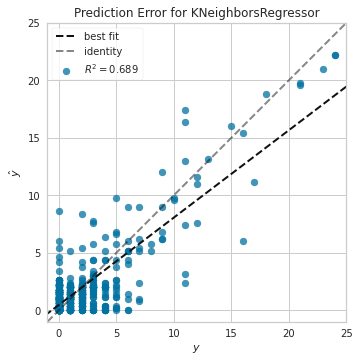

In [29]:
from yellowbrick.regressor import prediction_error
knn_model=KNeighborsRegressor()
knn_model.fit(train_prepared, y_train)
visualizer = prediction_error(knn_model, train_prepared, y_train, X_valid, y_valid)

#### XGBRegressor

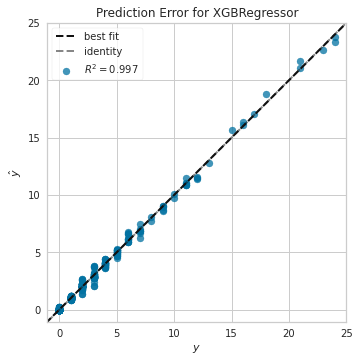

In [30]:
xgb_model=XGBRegressor(objective='reg:squarederror')
xgb_model.fit(X_train, y_train)
visualizer = prediction_error(xgb_model, X_train, y_train, X_valid, y_valid)

#### VotingRegressor

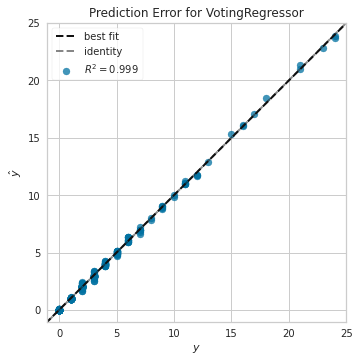

In [31]:
e_reg.fit(X_train, y_train)
visualizer = prediction_error(e_reg, X_train, y_train, X_valid, y_valid)

__Prediction Error Plot__

+ Here we are making the graph with actual value vs predicted value. 
+ The best fit line indicates the zero error which is also describes the magnitude of the data direction. We can easily identify the data variance with best fit line and identity line.
+ If we notice KNN model plot, then we can notice the data varacity but where as other models performed well where the deviation from the zero fit line to the identity line is very negligible.
+ We can observe that most of our data density is under range 10.
+ We can also notice that R2 score of KNN is very bad which is also evident that, that model will not perform well if we give unseen data.
+ But voting and XGBoost are promissing models, where R2 score is of the best ever achieved with above trained models and the generalization is also happening good with less deviation.
+ Hence if unseen data or future data is fed to these models then , we can say that these will perform good compared to others.


|  Model               |Training RMSE | Training RMSE with CV  | Validation RMSE      |
|--------------------- |--------------|------------------------|----------------------|
| LinearRegression     | 0.00067      |  0.009              |  0.0004                    |
| SVR                  |1.123      |  1.693              |  0.685                    |
| KNeighborsRegressor  |0.851       |  1.265              |  1.262                    |
| RandomForestRegressor| 0.05         |  0.284              | 0.049                     |
| Decision Tree        |  0.00    |  0.385              |         0.042             |
| LogisticRegression  |4.710      |  4.784              |  3.862                    |
| LGBMRegressor       | 0.137      |  0.405             |  0.0168                    |
| XGBRegressor        | 0.162      |  0.303              |  0.185                    |

* Training `LinearRegression` and `Decision Tree` model looks like overfitting the training data so we cross checked it through Cross Validation and RMSE value got incresed so can say it was overfitting the data, so the basic model is not performing well with our data.
* `LogisticRegression` is underfitting our data as both training and validation set has higher `RMSE` value.

* Now we can see there is vast difference between the values of Training RMSE and Training RMSE with CV on most of the models.
* Example: for both Boosting models, `LGBMRegressor` and `XGBRegressor` with cv they are not giving good results, but without CV we are getting lower rmse, the reason behind that is we cannot use normal CV for timeseries data as it will not slipt the data according to date.
* Even though we used timeseries CV, we may or may not achieve better result as there are chances that it might not capture the entire seasonality and trend while making the folds.
* Also CV assumes that all rows are independent but that cannot happen in Time series analysis as our current data depends on series of past data.
* So evaluating CV is misleading our model RMSE value.

* __After considering all the scenerios, amoung all the the models, `LGBMRegressor` and `XGBRegressor` is performing better, for both training and validation data, as both the models are performing good in training set as weel as on validation set.__

* Then We performed hypertuning for LGBM and XGBoost to increase the accuracy (i.e., reducing `RMSE`)

* we even performed ensemble method `VotingRegressor` combining both these model with default parameters (basic model) as we did not get better result then the basic model (with default parameters) as Training RMSE is high then validation RMSE for our  models after hyperparmeter tuning, which should not be the case as we should have less value for training RMSE then validation RMSE as it is trained using training model so we should have less error and should perform good in training data.


|  Model               | Validation RMSE before tuning | Training RMSE after tuning  | Validation RMSE after tuning      |
|--------------------- |--------------|------------------------|----------------------|
| LGBMRegressor     | 0.0168     |  0.25             |  0.061                   |
| XGBRegressor          0.185        |0.076     |  0.101              |  0.030                  |
| VotingRegressor  |---       |  0.111              |  0.095                    |



* so after evaluation finally we selected two models `XGBRegressor` with default parameters and `VotingRegressor` as our best models, as its performing good on both the training and validation test compared to other models.

__Selected Models__

|  Model               | Training RMSE | Validation RMSE     |
|--------------------- |------------------------|----------------------|
| XGBRegressor     |  0.039      |  0.076                    |
| VotingRegressor              |  0.068              |  0.047                    |



* We forecasted 28 days sold item counts for 20 products of california Store (CA_1) using `VotingRegressor` (combination of model `LGBMRegressor` and `XGBRegressor`) and `XGBRegressor` with default parameters.

__Challenges__

* The major challenge we encounter is the system limitation. Our system was not able to handle this huge amount of data. we face memory Error and Kernel dieing issue when we try to run any operation after preprocessing and exploration. We tried to use Kaggle and Google Colab but that didn't help us as well. So we finally reduce our data.
* We are not able to perform any hyper parameter tunning with our original data This is also one major roadblock for us due to which we reduce the data and perform Grid search on the reduce data



### 7. Conclusion
---
*(Briefly describe what you have done and what you have achieved. Discuss any shortcomings of the process and results. **Finally, discuss the lessons learned from doing the project**.)*

__Brief describtion of the project and goals acheived:__

* We choose the prediction and forecast competition dataset from kaggle. 
* The data comprises of 3049 individual products from 3 categories and 7 departments, sold in 10 stores in 3 states.
* Performed an intensive EDA where we found the trends based on Categorywise, Storewise, Seasonwise, and also based on holidays.
* We plotted the most sold items Storewise, Categorywise, Statewise, Daywise, and we found that on December month day 25th the sales is Zero.
* Experimented using the feature engineering techniques like Label encoding,introduce lags, mean encoding,trends and Rolling window statistics. 
* We then fed the data into various models, selected the best fit models, applied parameter tuning,also implemented ensemble methods on predicted data and forecast for the next 28 days.

__Lessons Learned during the project:__

* We had challenges while applying the normal CV for time-series data as it doesnt fitin the date column. 
* While making multiple folds in time-series CV,there are chances that it does't capture entire seasonality and end up in not so good results.
* Cross-validation assumes that all rows are indpendent but that cannot happen in time series analysis as our current data depends on the past data.
* Understood how the hyperparameter tuning takes long hours and it depends on the size of the dataset.
* Main learning is that we experimented on the feature engineering techniques  Label encoding,introduce lags, mean encoding,trends and Rolling window statistics. 
* Inorder to predict the productwise sales we have to split the dataset into different products and then apply ARIMA or Prophet individually (which would be tedious) as it usually predicts the overall sales.



### 8. References

https://www.kaggle.com/sanjayar/m5-forecasting-descriptive-charts-arima \
https://www.kaggle.com/tarunpaparaju/m5-competition-eda-models

---
(*Use the following requirements for writing your reports. DO NOT DELETE THE CELLS BELLOW*)

# Project Requirements

This final project examines the level of knowledge the students have learned from the course. The following course outcomes will be checked against the content of the report:

Upon successful completion of this course, a student will be able to:
* describe the mathematical concepts of machine learning algorithms (**However, you don't need to write the mathematical equations for each method you use. I will assume that you already know the math concepts behind the model when you use it in this project.**)
* select and apply appropriate machine learning algorithms for data science problems
* interpret the results of machine learning
* perform parameter tuning and error analysis; and
* compare the performance of multiple machine learning algorithms


**Marking will be foucsed on both presentation and content.** 

## Written Presentation Requirements
The report will be judged on the basis of visual appearance, grammatical correctness, and quality of writing, as well as its contents. Please make sure that the text of your report is well-structured, using paragraphs, full sentences, and other features of well-written presentation.